### Imports


In [12]:
import os
from matplotlib import pyplot as plt
from skimage.measure import block_reduce
from multiprocessing import Pool
import numpy as np
import librosa
from tqdm import tqdm

from time import time
import umap
import matplotlib.cm as cm
from sklearn import metrics
from sklearn.cluster import KMeans
from sklearn.datasets import load_digits
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
from sklearn.preprocessing import MinMaxScaler

import pickle

from utils import CLASSNAMES, CLASS_COLORS, SAMPLE_DIR, FEATURE_DIR



# Visualize two samples of each class

class_name	dimensions
______________________________
cel      	(388, 12000)
cla      	(505, 12000)
flu      	(451, 12000)
gac      	(637, 12000)
gel      	(760, 12000)
org      	(681, 12000)
pia      	(721, 12000)
sax      	(626, 12000)
tru      	(577, 12000)
vio      	(580, 12000)
voi      	(778, 12000)


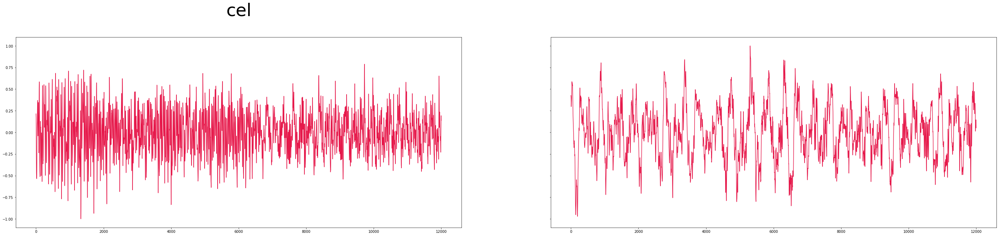

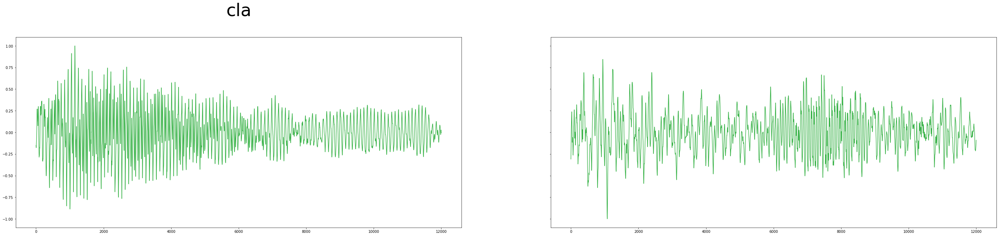

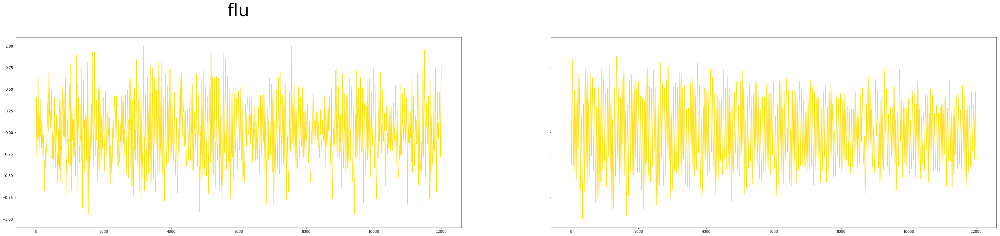

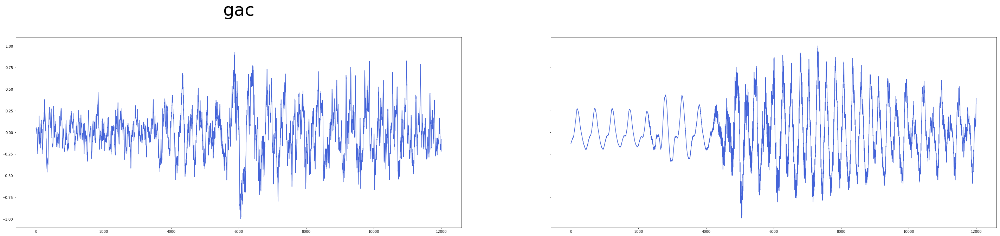

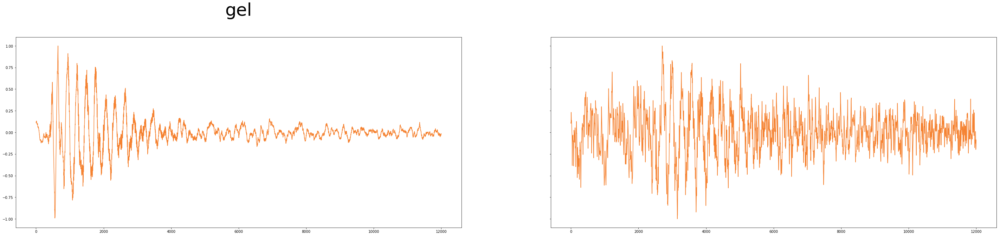

...

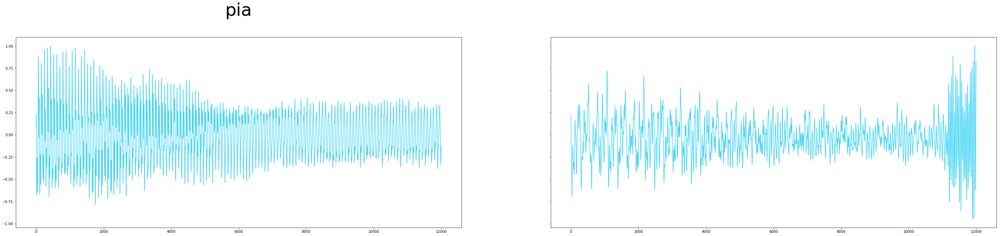

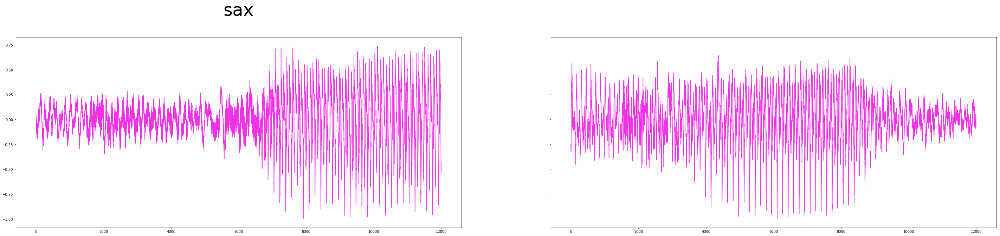

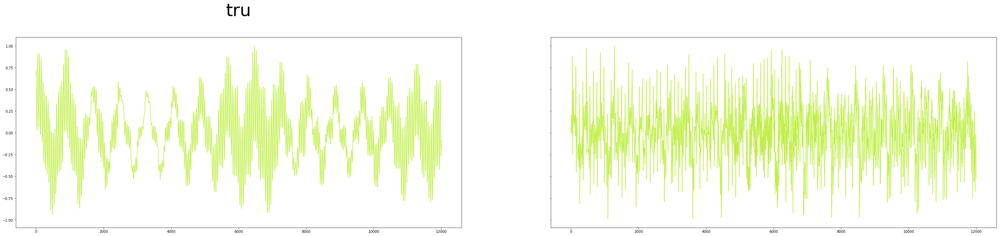

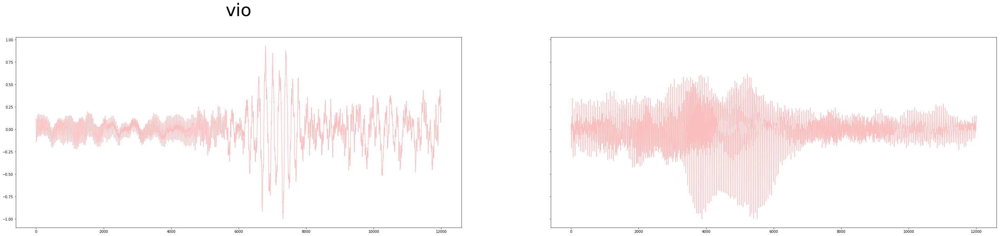

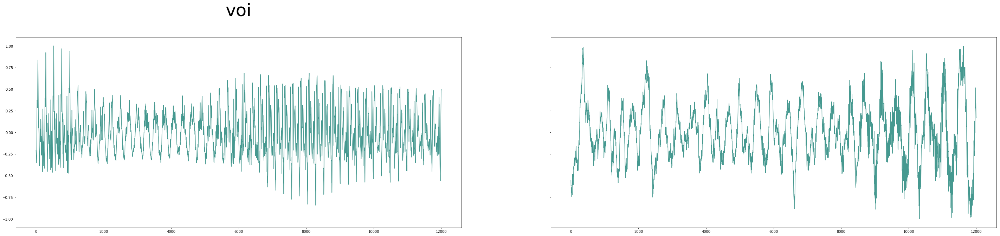

In [10]:
samples = {}
for d in CLASSNAMES:
    samples[d] = np.load(os.path.join(SAMPLE_DIR, d+'_samples.npy'))

def plot_samples(to_plot, name, color):    
    _, ax = plt.subplots(1, len(to_plot), sharey=True, figsize=(50, 10))
    for i, axis in enumerate(ax):
        axis.plot(to_plot[i], c=color)
        if i == 0:
            axis.set_title(name + "\n", fontsize=50)

# Define some pretty printing
print('class_name\tdimensions')
print('_' * 30)
for classname in CLASSNAMES:
    print('%-9s\t%s' % (classname, samples[classname].shape))

# Plot the samples
for classname, color in zip(CLASSNAMES, CLASS_COLORS):
    plot_samples(samples[classname][:2], classname, color)

In [13]:
def load_features(feature_name):
    features = []
    for classname in CLASSNAMES:
        file_path = os.path.join(FEATURE_DIR, '{}_{}.npy'.format(classname, feature_name))
        feature = np.load(file_path)
        features.extend(feature)
    features = np.asarray(features)
    print('{}\t{}'.format(feature_name, features.shape))
    features = features.reshape(len(features),-1)
    return features

def load_all_features(feature_dict):
    x_data_features = {}
    for feature_name in feature_dict:
        features = load_features(feature_name)
        x_data_features[feature_name] = features
    return x_data_features

# Define some pretty printing
print('feature_name\t original dimensions')
print('_'*35)

# Load all the features
feature_list = ['stft','mfcc']
x_data_dict = load_all_features(feature_list)

print('feature_name\t flat dimensions')
print('_' * 35)
for feature_name in feature_list:
    print('{}\t{}'.format(feature_name, x_data_dict[feature_name].shape))


feature_name	 original dimensions
___________________________________
stft	(6704, 32, 32)
mfcc	(6704, 30, 24)
feature_name	 flat dimensions
___________________________________
stft	(6704, 1024)
mfcc	(6704, 720)


# Labeling each class

('y_data_labels.shape:', (6704,))


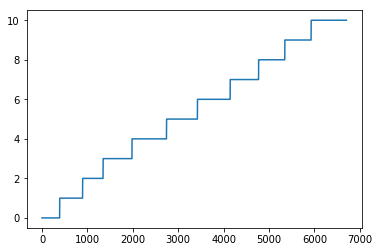

In [14]:
# Creating the ground truth labels

ground_labels = []
classnumbers = []
for i, classname in enumerate(CLASSNAMES):
    feature_file = np.load(os.path.join(FEATURE_DIR, classname + '_stft.npy'))
    no_samples = feature_file.shape[0]
    # Map how many of each sample in class
    # Classes are mapped classlabel = list index no
    ground_labels.extend([i] * no_samples)
    classnumbers.append(no_samples)
y_data_labels = np.asarray(ground_labels)

print("y_data_labels.shape:", y_data_labels.shape)
plt.figure()
plt.plot(y_data_labels)

# Ground truth color mapping
import itertools
def concatColors(segmentList, colorList):
    multiples = []
    for i in range(len(segmentList)):
        multiples.append([colorList[i]]*segmentList[i])
    return list(itertools.chain(*multiples))

colorMap = concatColors(classnumbers, CLASS_COLORS)

# Defining metrics for evaluation of the 2D viz

In [15]:
from scoring import evalMetrics

# Plotting the PCA 

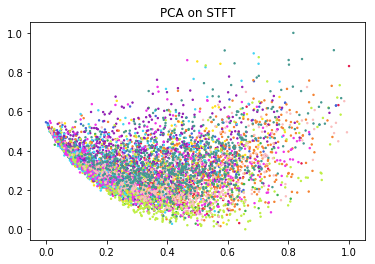

metric		 score
___________________________________
Silhouette	-0.16035406
Roundess 	0.8430936931558862
Overlap  	0.121735565273
-----------------------------------
Final Score	0.8044751955141072


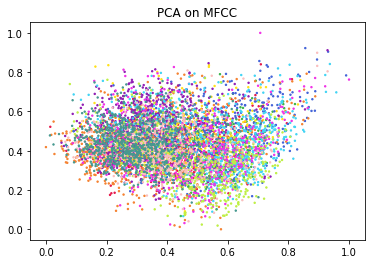

metric		 score
___________________________________
Silhouette	-0.15827398
Roundess 	0.8537649209459811
Overlap  	0.12736748227
-----------------------------------
Final Score	0.8228584231947637


In [16]:
def returnPCA(data):
    reduced_data = PCA(n_components=2).fit_transform(data)
    scaler = MinMaxScaler()
    scaler.fit(reduced_data)
    return scaler.transform(reduced_data)

def plot2D(reduced_data, colorMap, dim_red_type, feature):
    plt.scatter(reduced_data[:, 0], reduced_data[:, 1],c=colorMap,s=2)
    plt.title(dim_red_type + " on " + feature)
    plt.show()
    
def printMetrics(scores):
    print('metric\t\t score')
    print('_' * 35)
    print('%-9s\t%s' % ('Silhouette', scores[0]))
    print('%-9s\t%s' % ('Roundess', scores[1]))
    print('%-9s\t%s' % ('Overlap', scores[2]))
    print('-' * 35)
    print('%-9s\t%s' % ('Final Score', scores[3]))

# Return all PCA reduced data for each feature and store in a dictionary
pca_data_dict = {}
feature_list = ['stft','mfcc']
for feature_name in feature_list:
    pca_data_dict[feature_name] = returnPCA(x_data_dict[feature_name])

# Return all metrics for each PCA+feature combination and store in a dictionary
pca_scores_dict = {}
for feature_name in feature_list:
    pca_scores_dict[feature_name] = evalMetrics(pca_data_dict[feature_name], y_data_labels)

plot2D(pca_data_dict['stft'],colorMap,'PCA','STFT')
printMetrics(pca_scores_dict['stft'])

plot2D(pca_data_dict['mfcc'],colorMap,'PCA','MFCC')
printMetrics(pca_scores_dict['mfcc'])

('neighbour: ', 5, 'distance', 0.0)


/home/l/Workspace/Studia/PJATK/Sem4/PRO/Thesis/poc/venv/lib/python2.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../venv/lib/python2.7/site-packages/umap/utils.py", line 409:
@numba.njit(parallel=True)
def build_candidates(current_graph, n_vertices, n_neighbors, max_candidates, rng_state):
^

  current_graph, n_vertices, n_neighbors, max_candidates, rng_state
/home/l/Workspace/Studia/PJATK/Sem4/PRO/Thesis/poc/venv/lib/python2.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.

('neighbour: ', 5, 'distance', 0.001)
('neighbour: ', 5, 'distance', 0.01)
('neighbour: ', 5, 'distance', 0.1)
('neighbour: ', 5, 'distance', 0.5)
('neighbour: ', 10, 'distance', 0.0)
('neighbour: ', 10, 'distance', 0.001)
('neighbour: ', 10, 'distance', 0.01)
('neighbour: ', 10, 'distance', 0.1)
('neighbour: ', 10, 'distance', 0.5)
('neighbour: ', 15, 'distance', 0.0)
('neighbour: ', 15, 'distance', 0.001)
('neighbour: ', 15, 'distance', 0.01)
('neighbour: ', 15, 'distance', 0.1)
('neighbour: ', 15, 'distance', 0.5)
('neighbour: ', 30, 'distance', 0.0)
('neighbour: ', 30, 'distance', 0.001)
('neighbour: ', 30, 'distance', 0.01)
('neighbour: ', 30, 'distance', 0.1)
('neighbour: ', 30, 'distance', 0.5)
('neighbour: ', 50, 'distance', 0.0)
('neighbour: ', 50, 'distance', 0.001)
('neighbour: ', 50, 'distance', 0.01)
('neighbour: ', 50, 'distance', 0.1)
('neighbour: ', 50, 'distance', 0.5)
('neighbour: ', 5, 'distance', 0.0)


/home/l/Workspace/Studia/PJATK/Sem4/PRO/Thesis/poc/venv/lib/python2.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


('neighbour: ', 5, 'distance', 0.001)
('neighbour: ', 5, 'distance', 0.01)
('neighbour: ', 5, 'distance', 0.1)
('neighbour: ', 5, 'distance', 0.5)
('neighbour: ', 10, 'distance', 0.0)
('neighbour: ', 10, 'distance', 0.001)
('neighbour: ', 10, 'distance', 0.01)
('neighbour: ', 10, 'distance', 0.1)
('neighbour: ', 10, 'distance', 0.5)
('neighbour: ', 15, 'distance', 0.0)
('neighbour: ', 15, 'distance', 0.001)
('neighbour: ', 15, 'distance', 0.01)
('neighbour: ', 15, 'distance', 0.1)
('neighbour: ', 15, 'distance', 0.5)
('neighbour: ', 30, 'distance', 0.0)
('neighbour: ', 30, 'distance', 0.001)
('neighbour: ', 30, 'distance', 0.01)
('neighbour: ', 30, 'distance', 0.1)
('neighbour: ', 30, 'distance', 0.5)
('neighbour: ', 50, 'distance', 0.0)
('neighbour: ', 50, 'distance', 0.001)
('neighbour: ', 50, 'distance', 0.01)
('neighbour: ', 50, 'distance', 0.1)
('neighbour: ', 50, 'distance', 0.5)


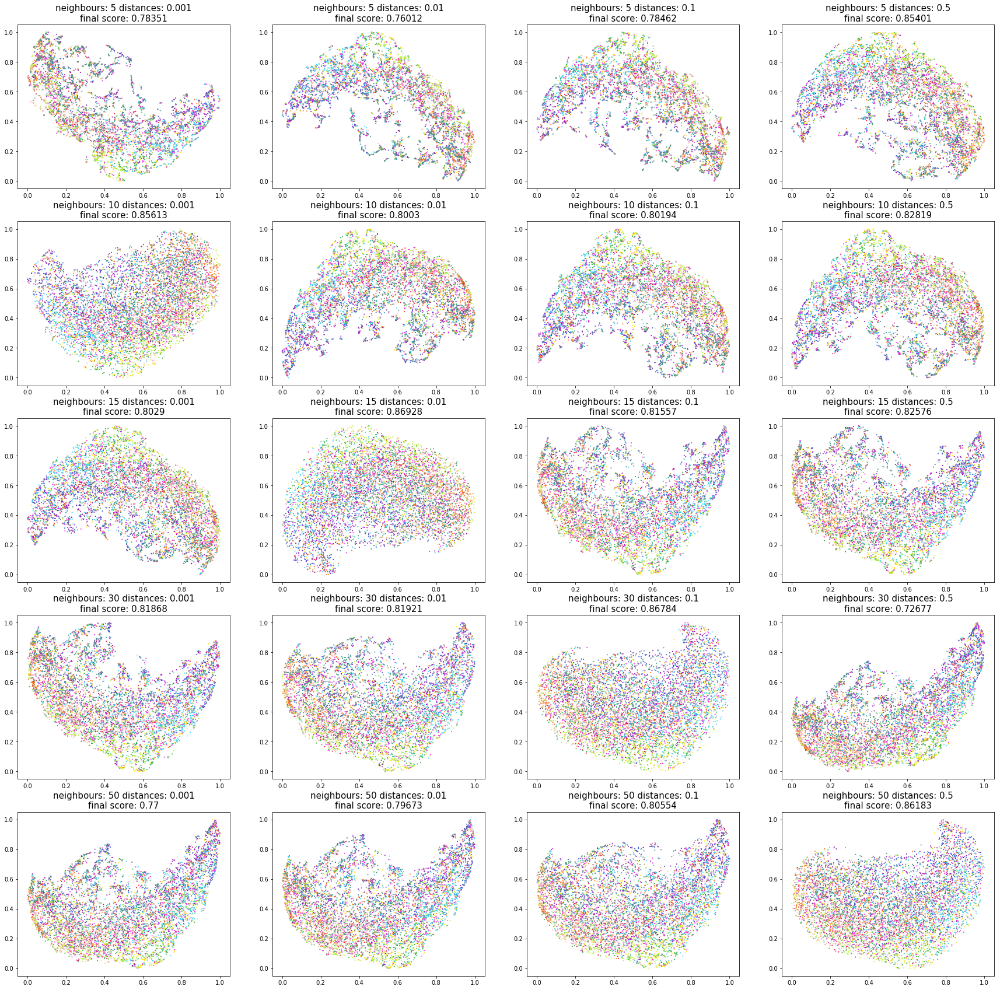

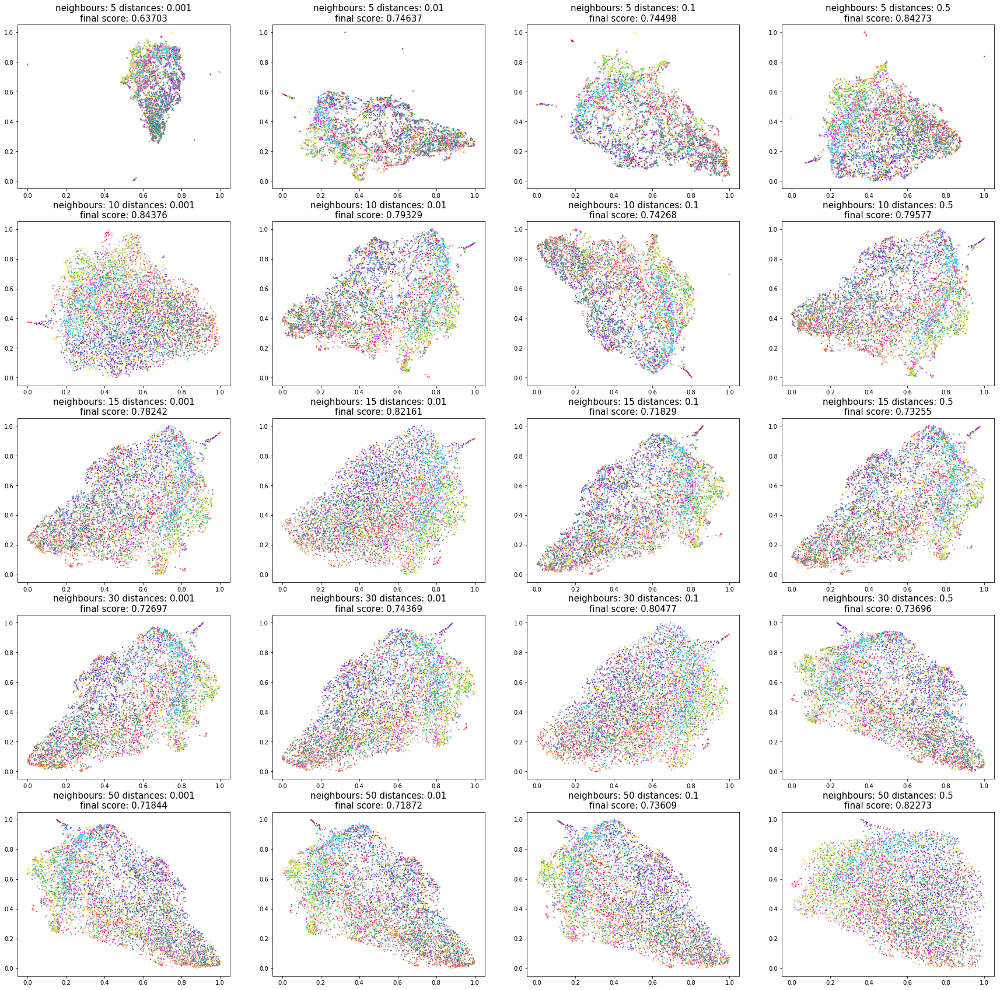

In [18]:
# UMAP 2D

def get_scaled_umap_embeddings(features, neighbour, distance):
    
    embedding = umap.UMAP(n_neighbors=neighbour,
                          min_dist=distance,
                          metric='correlation').fit_transform(features)
    scaler = MinMaxScaler()
    scaler.fit(embedding)
    return scaler.transform(embedding)

def gridSearchUMAP(x_data):
    umap_embeddings = []
    neighbours = [5, 10, 15, 30, 50]
    distances = [0.000, 0.001, 0.01, 0.1, 0.5]
    for i, neighbour in enumerate(neighbours):
        for j, distance in enumerate(distances):
            start_time = time()
            print("neighbour: ",neighbour,"distance",distance)
            umap_embedding = get_scaled_umap_embeddings(x_data, neighbour, distance)
            umap_embeddings.append(umap_embedding)
    return umap_embeddings

def gridSearchUMAPallFeatures(x_data_dict):
    umap_data_dict = {}
    feature_list = ['stft','mfcc']
    for feature_name in feature_list:
        umap_data_dict[feature_name] = gridSearchUMAP(x_data_dict[feature_name])
    return umap_data_dict

umap_data_dict = gridSearchUMAPallFeatures(x_data_dict)
with open('./artifacts/umap_map_all_features.pkl','wb+') as f:
    pickle.dump(umap_data_dict, f)

def plotUMAPmap(embedding, labels):
    neighbours = [5, 10, 15, 30, 50]
    distances = [0.001, 0.01, 0.1, 0.5]
    fig, ax = plt.subplots(nrows=len(neighbours), 
                       ncols=len(distances),
                       figsize=(30, 30))

    for i, row in enumerate(ax):
        for j, col in enumerate(row):
            current_plot = i * len(distances) + j
            col.scatter(embedding[current_plot].T[0], 
                        embedding[current_plot].T[1], 
                        c=colorMap,
                        s=1)
            (s_score, r_score, o_score, f_score) = evalMetrics(embedding[current_plot], labels)
            col.set_title("neighbours: " + str(neighbours[i]) + " distances: " + str(distances[j]) + '\n' +
                         "final score: " + str(round(f_score,5)),fontdict={'fontsize': 15})
    plt.show()

umap_map_dict = pickle.load(open('./artifacts/umap_map_all_features.pkl','rb'))

def plotUMAPmap(embedding, labels):
    neighbours = [5, 10, 15, 30, 50]
    distances = [0.001, 0.01, 0.1, 0.5]
    fig, ax = plt.subplots(nrows=len(neighbours),
                       ncols=len(distances),
                       figsize=(30, 30))

    for i, row in enumerate(ax):
        for j, col in enumerate(row):
            current_plot = i * len(distances) + j
            col.scatter(embedding[current_plot].T[0],
                        embedding[current_plot].T[1],
                        c=colorMap,
                        s=1)
            (s_score, r_score, o_score, f_score) = evalMetrics(embedding[current_plot], labels)
            col.set_title("neighbours: " + str(neighbours[i]) + " distances: " + str(distances[j]) + '\n' +
                         "final score: " + str(round(f_score,5)),fontdict={'fontsize': 15})
    plt.show()


plotUMAPmap(umap_map_dict['stft'],y_data_labels)

plotUMAPmap(umap_map_dict['mfcc'],y_data_labels)

In [20]:
import umap
import time

# Grid search over a variety of PCA dimensions before doing UMAP dimensionality reduction
def gridSearchPCAUMAP(x_data):
    pca_umap_dict = {}
    pca_dims = [2,4,6,8,10,12,14,16,20,22]
    for key in pca_dims:
        pca_umap_dict[key] = {}
    
    for i, pca_dim in enumerate(pca_dims):
        start_time = time.time()
        reduced_data = PCA(n_components=pca_dim).fit_transform(x_data)
        embedding = get_scaled_umap_embeddings(reduced_data, 50, 0.5)
        end_time = time.time() - start_time
        (s_score, r_score, o_score, f_score) = evalMetrics(embedding, y_data_labels)
        pca_umap_dict[pca_dim]['embedding'] = embedding
        pca_umap_dict[pca_dim]['time'] = end_time
        pca_umap_dict[pca_dim]['score'] = f_score
        print('pca_dim: ', pca_dim, 'duration (s): ',round(end_time,2),'score: ', round(f_score,4))
    return pca_umap_dict

In [21]:
pca_umap_dict = gridSearchPCAUMAP(x_data_dict['stft'])


('pca_dim: ', 2, 'duration (s): ', 133.18, 'score: ', 0.2609)
('pca_dim: ', 4, 'duration (s): ', 19.61, 'score: ', 0.9049)
('pca_dim: ', 6, 'duration (s): ', 20.8, 'score: ', 0.9033)
('pca_dim: ', 8, 'duration (s): ', 21.33, 'score: ', 0.8923)
('pca_dim: ', 10, 'duration (s): ', 21.67, 'score: ', 0.8818)
('pca_dim: ', 12, 'duration (s): ', 22.07, 'score: ', 0.8739)
('pca_dim: ', 14, 'duration (s): ', 22.6, 'score: ', 0.8674)
('pca_dim: ', 16, 'duration (s): ', 22.73, 'score: ', 0.8667)
('pca_dim: ', 20, 'duration (s): ', 24.06, 'score: ', 0.8673)
('pca_dim: ', 22, 'duration (s): ', 23.82, 'score: ', 0.8722)


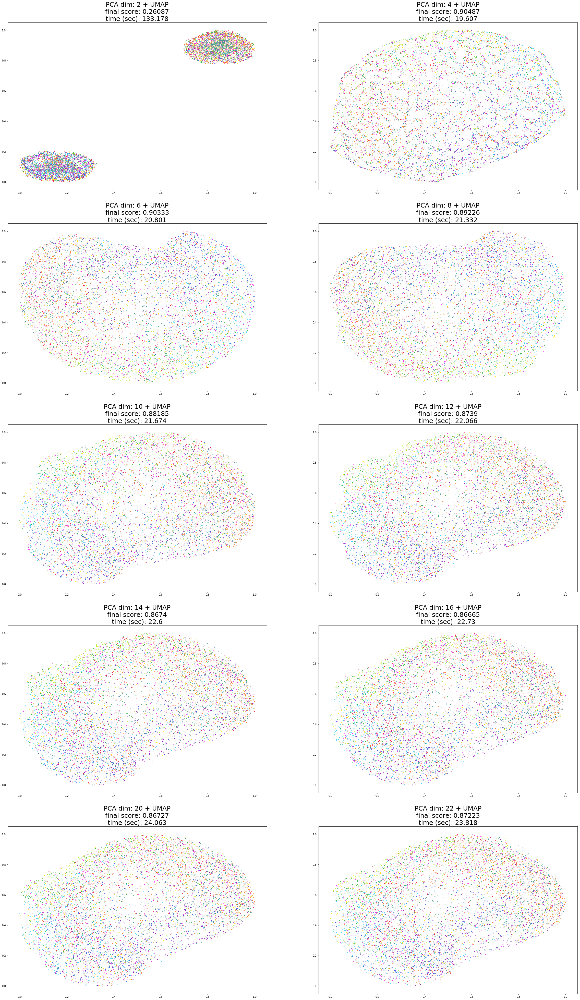

In [22]:
fig, ax = plt.subplots(nrows=5, 
                   ncols=2,
                   figsize=(40, 70))

pca_dims = [2,4,6,8,10,12,14,16,20,22]

for row_idx, row in enumerate(ax):
    for col_idx, col in enumerate(row):
        current_plot = row_idx * 2 + col_idx
        #print(row_idx, col_idx, current_plot)
        pca_dim = pca_dims[current_plot]
        
        embedding = pca_umap_dict[pca_dim]['embedding']
        time = pca_umap_dict[pca_dim]['time']
        score = pca_umap_dict[pca_dim]['score']
        
        col.scatter(embedding.T[0], 
                    embedding.T[1], 
                    c=colorMap,
                    s=4)      
        col.set_title("PCA dim: " + str(pca_dim) + " + UMAP" + "\nfinal score: " + str(round(score,5)) + "\ntime (sec): " + str(round(time,3)), fontdict={'fontsize': 25})